<a href="https://colab.research.google.com/github/Jagdishkharatmol/Car-selling-price-prediction/blob/main/carscan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [ ]:
import zipfile
with zipfile.ZipFile("model.zip","r") as zip_ref:
  zip_ref.extractall('/content/')

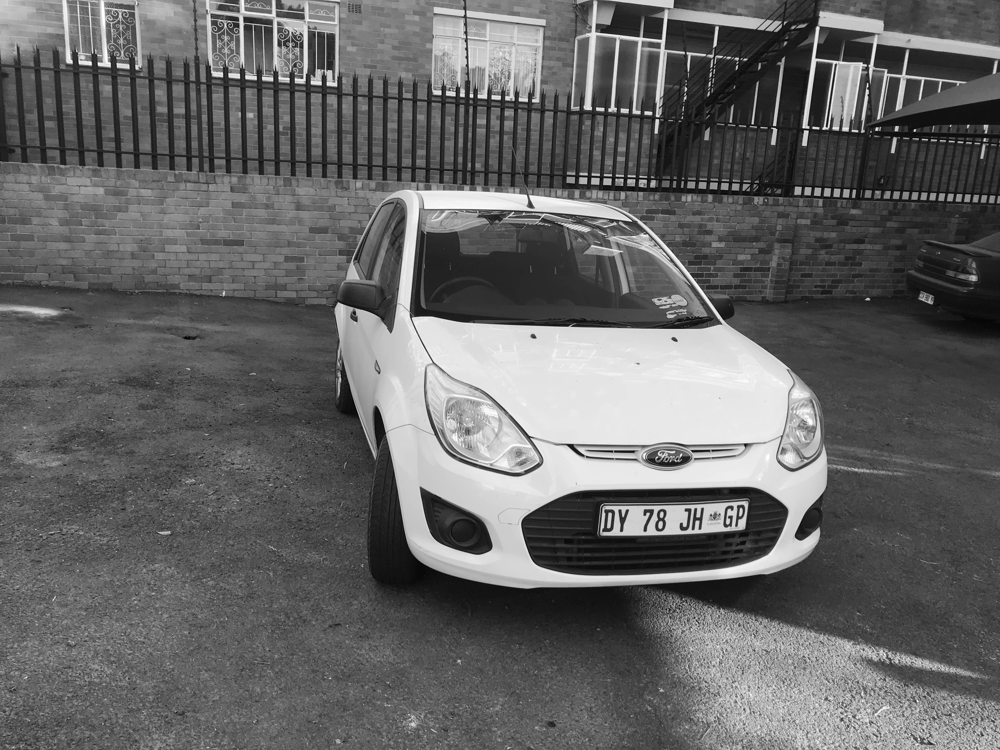

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
input_path="/content/gdrive/MyDrive/share/view4.jpeg"
output_path="/content/gdrive/MyDrive/share/view_Output_Expected.jpeg"
inp=cv2.imread(input_path,0)
cv2_imshow(inp)


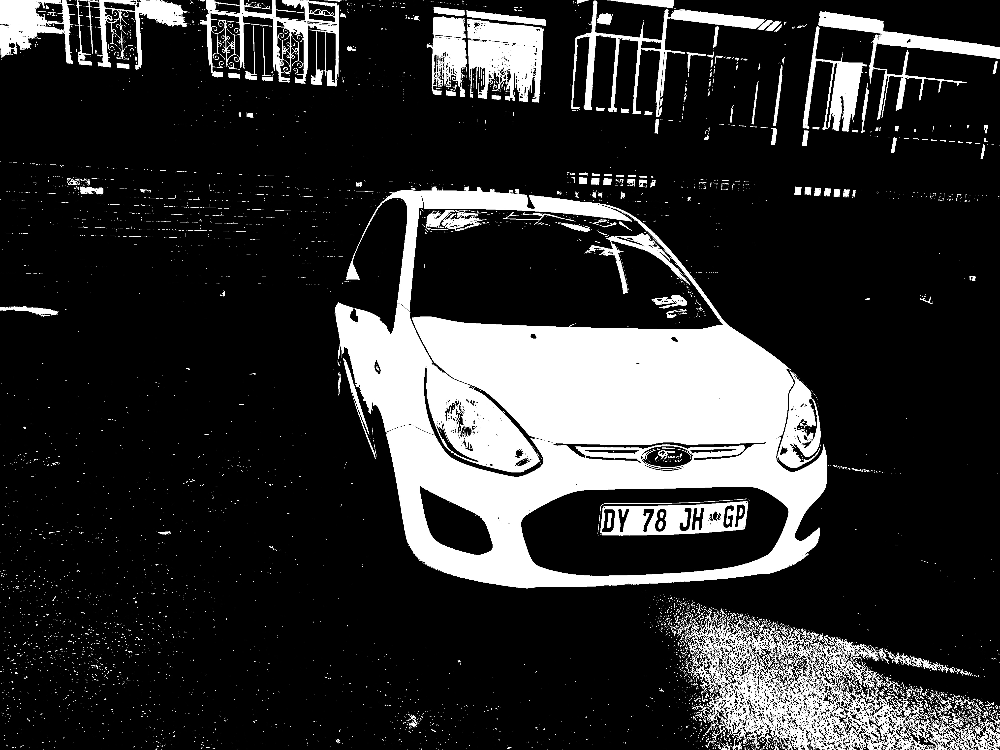

In [ ]:
_,th1=cv2.threshold(src=inp,maxval=255,thresh=150,type=cv2.ADAPTIVE_THRESH_MEAN_C)
cv2.imwrite("thre.jpeg",th1)
img=cv2.imread("thre.jpeg",1)
cv2_imshow(img)

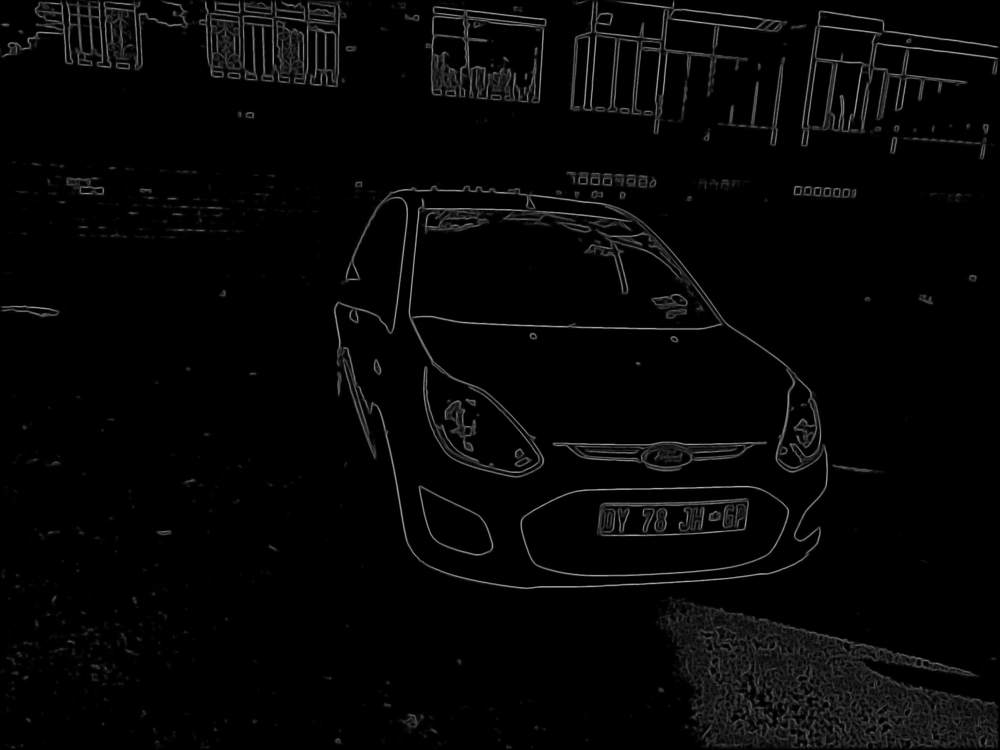

True

In [ ]:
src = cv2.imread("thre.jpeg", 1)
#blurred = cv2.GaussianBlur(src, (5, 5), 0)
blurred = cv2.medianBlur(src, 5)
blurred_float = blurred.astype(np.float32) / 255.0

edgeDetector = cv2.ximgproc.createStructuredEdgeDetection("model.yml")
edges = edgeDetector.detectEdges(blurred_float) * 255.0
cv2_imshow(edges)
cv2.imwrite('edge-raw.jpeg', edges)

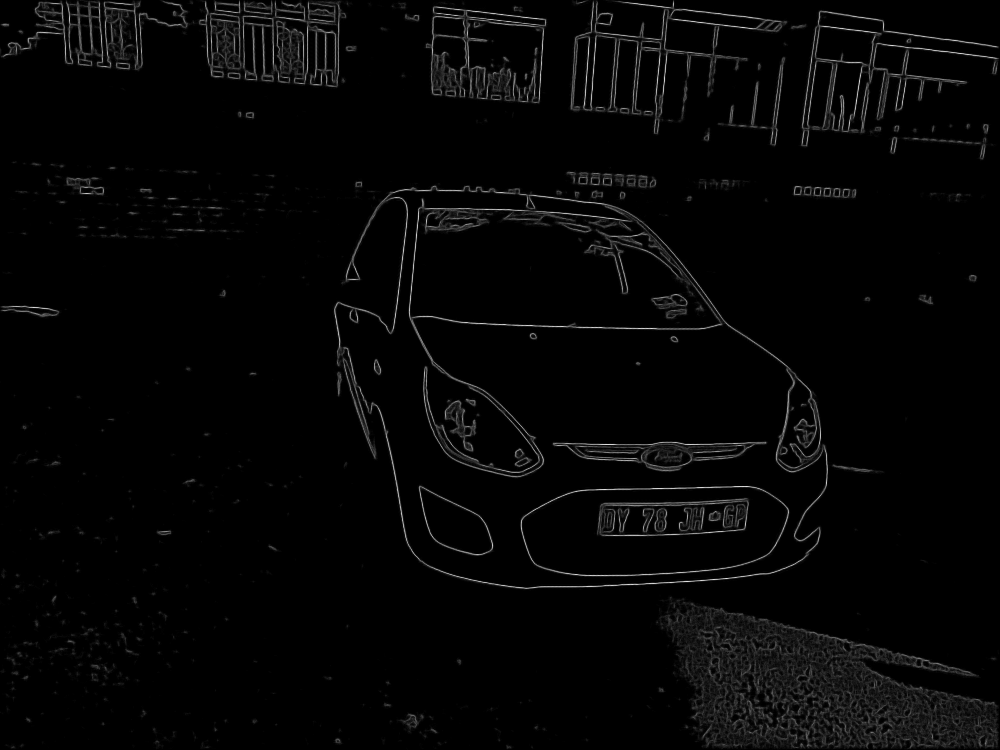

True

In [ ]:
def filterOutSaltPepperNoise(edgeImg):
    # Get rid of salt & pepper noise.
    count = 0
    lastMedian = edgeImg
    median = cv2.medianBlur(edgeImg, 3)
    while not np.array_equal(lastMedian, median):
        # get those pixels that gets zeroed out
        zeroed = np.invert(np.logical_and(median, edgeImg))
        edgeImg[zeroed] = 0

        count = count + 1
        if count > 100:
            break
        lastMedian = median
        median = cv2.medianBlur(edgeImg, 3)


edges_8u = np.asarray(edges, np.uint8)
filterOutSaltPepperNoise(edges_8u)
cv2_imshow(edges_8u)
cv2.imwrite('edge.jpg', edges_8u)

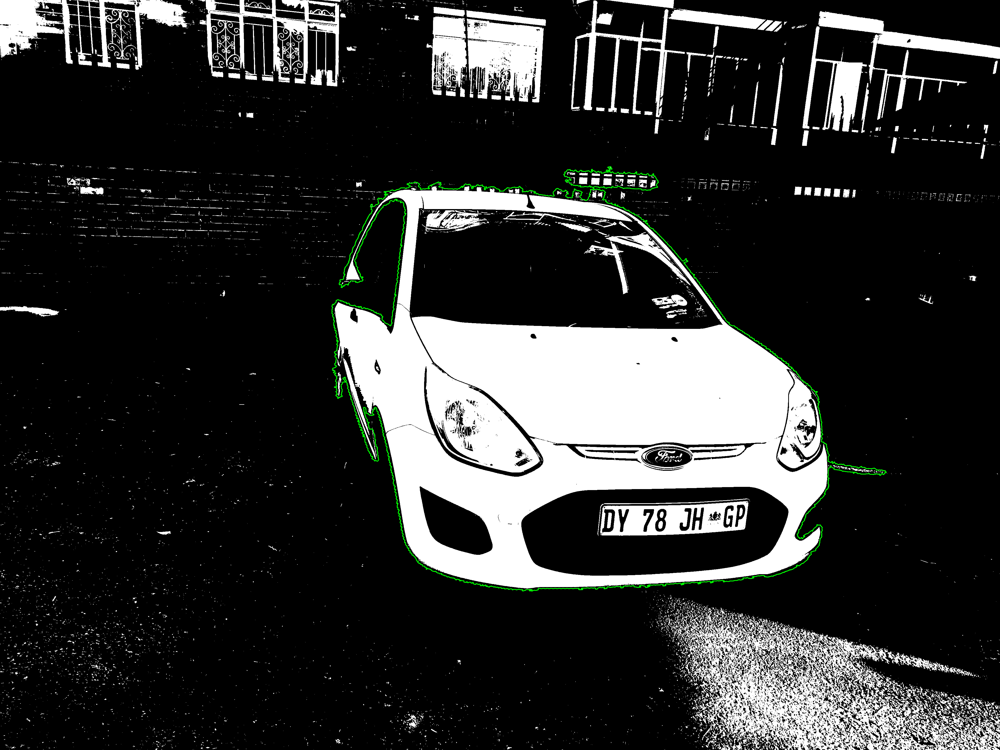

True

In [ ]:
def findLargestContour(edgeImg):
    contours, hierarchy = cv2.findContours(
        edgeImg,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )
    
    # From among them, find the contours with large surface area.
    contoursWithArea = []
    for contour in contours:
        area = cv2.contourArea(contour)
        contoursWithArea.append([contour, area])
		
    contoursWithArea.sort(key=lambda tupl: tupl[1], reverse=True)
    largestContour = contoursWithArea[0][0]
    return largestContour


contour = findLargestContour(edges_8u)
# Draw the contour on the original image
contourImg = np.copy(src)
cv2.drawContours(contourImg, [contour], 0, (0, 255, 0), 2, cv2.LINE_AA, maxLevel=1)
cv2_imshow(contourImg)
cv2.imwrite('contour.jpg', contourImg)

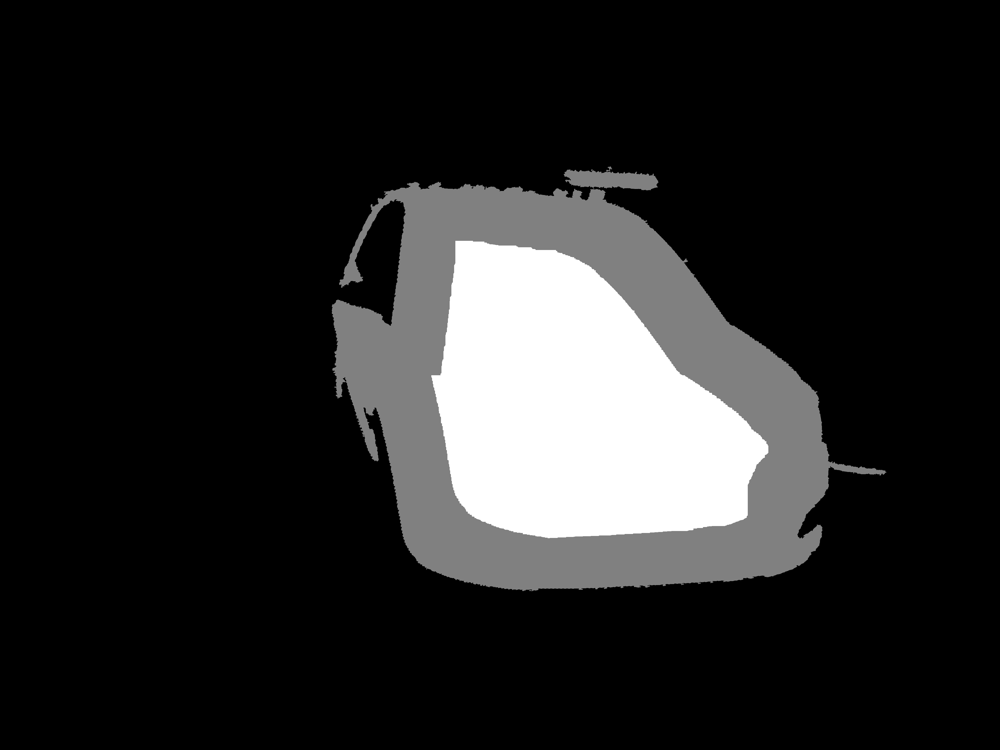

(array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 array([[8.86138275e-01, 5.95019880e-02, 3.56424814e-02, 9.74506847e-03,
         8.97218675e-03, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
         2.55000000e+02, 2.55000000e+02, 2.55000000e+02, 1.85517382e+00,
         1.85517382e+00, 1.85517382e+00, 2.52339233e+02, 2.52339233e+02,
         2.52339233e+02, 2.54000000e+02, 2.54000000e+02, 2.54000000e+02,
         1.00000000e-02, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
         1.00000000e-02, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
         1.00000000e-02, 1.00000000e-02, 0.00000000e+00, 0.00000000e+00,
         0.00000000e+00, 1.00000000e-02, 0.00000000e+00, 0.00000000e+00,
         0.00000000e+00, 1.00000000e-02, 1.13997623e+00, 1.12997623e+00,
         1.12997623e+00, 1.12997623e+00, 1.1

In [ ]:
mask = np.zeros_like(edges_8u)
cv2.fillPoly(mask, [contour], 255)                                                                    #0-black #255-white

# calculate sure foreground area by dilating the mask
mapFg = cv2.erode(mask, np.ones((5, 5), np.uint8), iterations=100)

# mark inital mask as "probably background"
# and mapFg as sure foreground
trimap = np.copy(mask)
trimap[mask == 0] = cv2.GC_BGD
trimap[mask == 255] = cv2.GC_PR_BGD
trimap[mapFg == 255] = cv2.GC_FGD

# visualize trimap
trimap_print = np.copy(trimap)
trimap_print[trimap_print == cv2.GC_PR_BGD] = 128
trimap_print[trimap_print == cv2.GC_FGD] = 255
cv2_imshow(trimap_print)
cv2.imwrite('trimap.png', trimap_print)



# run grabcut
bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)
rect = (0, 0, mask.shape[0] - 1, mask.shape[1] - 1)
cv2.grabCut(src, trimap, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_MASK)

In [ ]:
# create mask again
mask2 = np.where(
    (trimap == cv2.GC_FGD) | (trimap == cv2.GC_PR_FGD),
    255,
    0
).astype('uint8')
cv2.imwrite('mask2.jpg', mask2)



# blended alpha cut-out
mask3 = np.repeat(mask2[:, :, np.newaxis], 3, axis=2)
mask4 = cv2.GaussianBlur(mask3, (3, 3), 0)
alpha = mask4.astype(float) * 1.1  # making blend stronger
alpha[mask3 > 0] = 255.0
alpha[alpha > 255] = 255.0

foreground = np.copy(src).astype(float)
foreground[mask4 == 0] = 0
background = np.ones_like(foreground, dtype=float) * 255.0

cv2.imwrite('foreground.png', foreground)
cv2.imwrite('background.png', background)
cv2.imwrite('alpha.png', alpha)

# Normalize the alpha mask to keep intensity between 0 and 1
alpha = alpha / 255.0
# Multiply the foreground with the alpha matte
foreground = cv2.multiply(alpha, foreground)
# Multiply the background with ( 1 - alpha )
background = cv2.multiply(1.0 - alpha, background)
# Add the masked foreground and background.
cutout = cv2.add(foreground, background)
cv2_imshow(cutout)
cv2.imwrite('cutout.jpg', cutout)

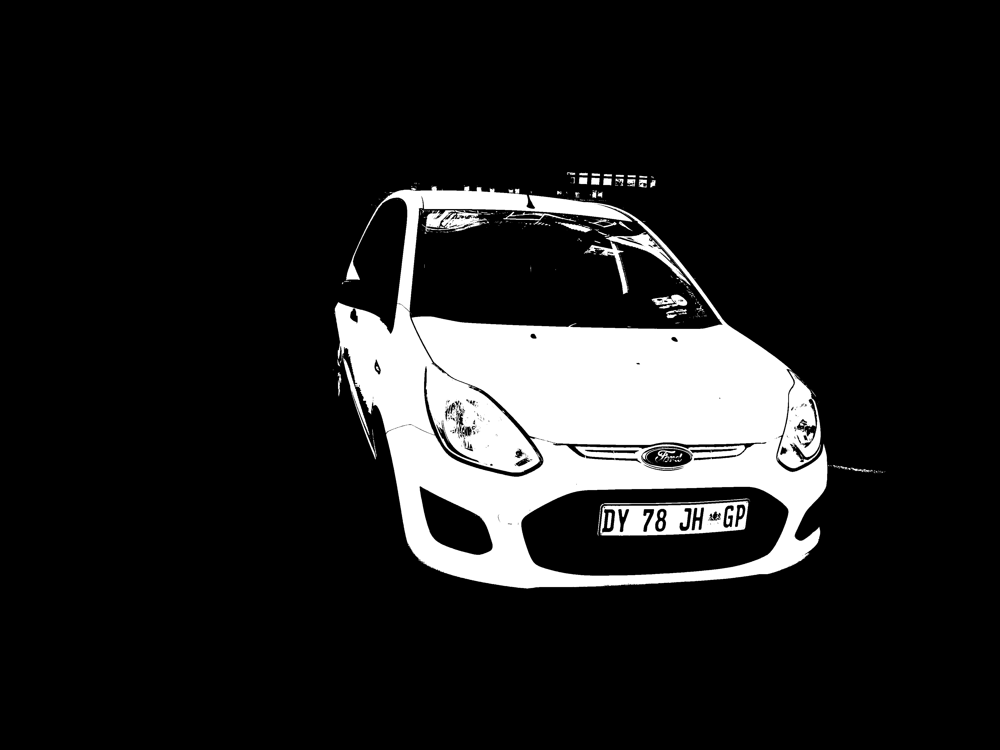

In [ ]:
cv2_imshow(foreground)